In [4]:
#Packages
%pylab
%matplotlib inline
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt
from images_segmentation import otsu as ot

Using matplotlib backend: <object object at 0x000001AF589AEBF0>
%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


c:\Users\ievas\anaconda3\envs\dataanalysis0104_env\lib\site-packages\IPython\core\magics\pylab.py:162: UserWarning: pylab import has clobbered these variables: ['array', 'add']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [5]:
# otsu_i function
#works on gt images, for some reason thresholding of everything else gives me only 'b' ://
def otsu_i(image):
    img=ot.otsu_thresholding(image, 256)
    i = img.shape[0]
    j = img.shape[1]
    it = [[[] * 1] * j] * i
    for x, y in np.ndindex((i-1,j-1)):
            if img[x,y] != 0:
                it[x][y]='f'
            else:
                it[x][y]='b'
    return it


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


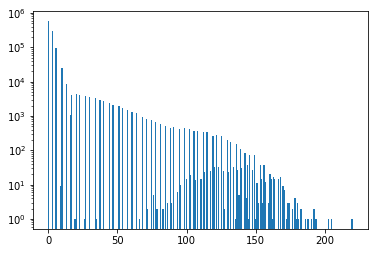

In [6]:
img_1 = imread(r"data\Otsu_data\N2DH-GOWT1\img\t39.tif") 
print(ot.otsu_thresholding(img_1,256))

[['b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',
  'f',

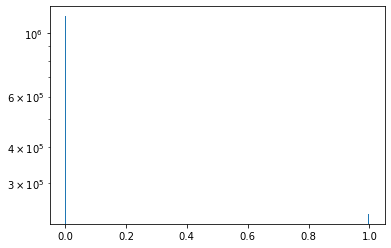

In [7]:
img_1 = imread(r"data\Otsu_data\N2DH-GOWT1\img\t39.tif") 
img_3 = imread(r"data\Otsu_data\N2DL-HeLa\img\t13.tif") 
gt10 = plt.imread(r'data\Otsu_data\NIH3T3\gt\33.png')
otsu_i(gt10)

In [8]:
#image cropping?????
#WORKS???
def crop(image,x,y,w,z):
    h = w-x
    w = z-y
    cropped = np.zeros([h,w])
    for a in range(x,w):
        for b in range(y,z):
            cropped[a-x,b-y]=image[a,b]
    return cropped
    


In [9]:
cropped=np.zeros([3,4])
print(cropped)

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [10]:

crop(gt10,50,50,100,100)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

4220.823281571786

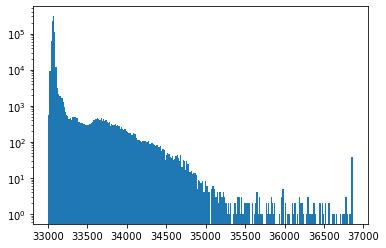

In [11]:
# otsu thresholding
def otsu_t(img,x):
    import matplotlib.pyplot
    import numpy
#bins optimieren.... alles zu 0-255 machen


   # load histogram, Mathematische werte aus Histogramm rausgreifen
    n, bins, patches = matplotlib.pyplot.hist(img.flatten(),log = 'False',bins = x)

   # initialize threshold value (T = 0) 
    thres = 0
    copy = img.copy()

    # create list to store values of within class variance for each threshold value
    bcv = list()
    
    # set up initial values
    for i in range(0,len(n)):
        bclv = 0
        w0_sum = 0
        mean_sum0 = 0
        v0_sum = 0
        mean_sum1 = 0
        v1_sum = 0
        w0 = 0
        w1 = 0
        w1_sum = 0

        #sum up the probabilites of each intensity value;  and the mean value (sind noch nicht happy mit der definition :()
        for j in range(0,i+1):
            w0_sum += n[j]
            mean_sum0 += bins[j]*n[j]
            
        # background class probabilites and class mean levels
        w0 = w0_sum / sum(n)  
        if(sum(n[0:i+1]) != 0):  
             mean_0 = mean_sum0 / sum(n[0:i+1])
        else: mean_0 = 0
        
        # compute background class variance
        for m in range(0,i+1):
            v0_sum += ((bins[m]-mean_0)** 2) * n[m]
        
        v0 = v0_sum / sum(n[0:i+1])
        
        # sum up the probabilites of each intensity value;  and the mean value
        for k in range(i+1, len(n)): 
            w1_sum += n[k]
          
            mean_sum1 += bins[k]*n[k]

        # compute foreground class probabilities and class mean levels    
        w1 = w1_sum / sum(n)
     
        if(sum(n[i+1:len(n)]) != 0):
            mean_1 = mean_sum1 / sum(n[i+1:len(n)])
        else: mean_1 = 0
        # compute foreground class variance 
        for s in range(i+1,len(n)):
            v1_sum += ((bins[s]-mean_1) ** 2) * n[s]
        if( sum(n[i+1:len(n)]) != 0):
            v1 = v1_sum / sum(n[i+1:len(n)])
        else: v1 = 0

        # compute within class variance and append to list
        bclv = (w0 * v0) + (w1 * v1)
        bcv.append(bclv)

    # select optimal threshold value, minimum value of within class variance
    optimal_thres = min(bcv)
    return optimal_thres

otsu_t(img_3, 256)

In [12]:
a = np.zeros(shape=(3,3,1,1))
print(a)

np.insert(a,[0,0,0], [5])
print(a)

[[[[0.]]

  [[0.]]

  [[0.]]]


 [[[0.]]

  [[0.]]

  [[0.]]]


 [[[0.]]

  [[0.]]

  [[0.]]]]
[[[[0.]]

  [[0.]]

  [[0.]]]


 [[[0.]]

  [[0.]]

  [[0.]]]


 [[[0.]]

  [[0.]]

  [[0.]]]]


In [13]:
array = [[[0]*1]*3]*3
print(array)
print(array[0][0][0])
add = [5,5,5]
array[0][0][0] = 5
print(array)

[[[0], [0], [0]], [[0], [0], [0]], [[0], [0], [0]]]
0
[[[5], [5], [5]], [[5], [5], [5]], [[5], [5], [5]]]


In [26]:
arr = np.zeros((5,5,1))

arr[0,0] = arr[0,0]+5
print(arr)

[[[5.]
  [0.]
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  [0.]
  [0.]]]
